## Problem statement: Classify the Red and White wine with the given data sets

#### Imperting all the dependencies

In [1]:
import warnings
warnings.filterwarnings("ignore")
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
import plotly.express as px
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix , classification_report, plot_confusion_matrix
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn import tree

#### Reading the data

In [2]:
Bronoc_red = pd.read_csv("Bronoc-red.csv", delimiter=";")
Bronoc_white = pd.read_csv("Bronoc-white.csv", delimiter=";")

In [3]:
Bronoc_red.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [4]:
Bronoc_white.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4898 entries, 0 to 4897
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         4898 non-null   float64
 1   volatile acidity      4898 non-null   float64
 2   citric acid           4898 non-null   float64
 3   residual sugar        4898 non-null   float64
 4   chlorides             4898 non-null   float64
 5   free sulfur dioxide   4898 non-null   float64
 6   total sulfur dioxide  4898 non-null   float64
 7   density               4898 non-null   float64
 8   pH                    4898 non-null   float64
 9   sulphates             4898 non-null   float64
 10  alcohol               4898 non-null   float64
 11  quality               4898 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 459.3 KB


In [5]:
print("Red wine data frame shape:", Bronoc_red.shape[0])
print("Red wine data frame shape:", Bronoc_white.shape[0])

Red wine data frame shape: 1599
Red wine data frame shape: 4898


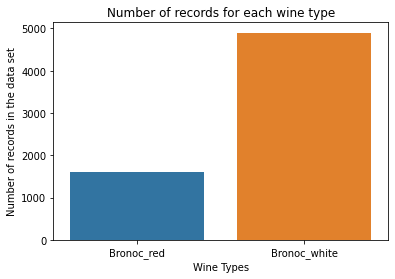

In [6]:
fig = sns.barplot(x = ["Bronoc_red", "Bronoc_white"], y=[Bronoc_red.shape[0], Bronoc_white.shape[0]])
fig.set(xlabel='Wine Types', ylabel='Number of records in the data set', title = "Number of records for each wine type")
plt.show()

In [7]:
(Bronoc_white.shape[0]/Bronoc_red.shape[0])

3.063164477798624

Almost we have 1:3 Ratio for Red_wine and White_wine; For every one record in Red_wine there are 3 records for White wine

Numebr of records for Bronoc_white is grater than the number of records of Bronoc_red. Hence it is an **imbalanaced data set**. 
Imbalance data set can lead to **high bias model**  (underfitting)

Performance measuer like accuracy is not good measure of the model when we have imbalance data set

In [8]:
Bronoc_red.columns == Bronoc_white.columns

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True])

In [9]:
Bronoc_red["class_label"] = 0
Bronoc_white["class_label"] = 1
# Representing Red_wine with class label 0 and white with 1

In [10]:
Wine_data = pd.concat([Bronoc_red, Bronoc_white]).reset_index(drop=True)

In [11]:
Wine_data.shape

(6497, 13)

In [12]:
Wine_data.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,class_label
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,0
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,0
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,0
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,0
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,0


In [13]:
Wine_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         6497 non-null   float64
 1   volatile acidity      6497 non-null   float64
 2   citric acid           6497 non-null   float64
 3   residual sugar        6497 non-null   float64
 4   chlorides             6497 non-null   float64
 5   free sulfur dioxide   6497 non-null   float64
 6   total sulfur dioxide  6497 non-null   float64
 7   density               6497 non-null   float64
 8   pH                    6497 non-null   float64
 9   sulphates             6497 non-null   float64
 10  alcohol               6497 non-null   float64
 11  quality               6497 non-null   int64  
 12  class_label           6497 non-null   int64  
dtypes: float64(11), int64(2)
memory usage: 660.0 KB


No missing data in the entire data set

# EDA

#  Differet types of multivarient data analysis
- Pair plots
- Joint plots
- Heat maps

### Pari plots

Text(0.5, 0.98, 'Pair plots of Wine components')

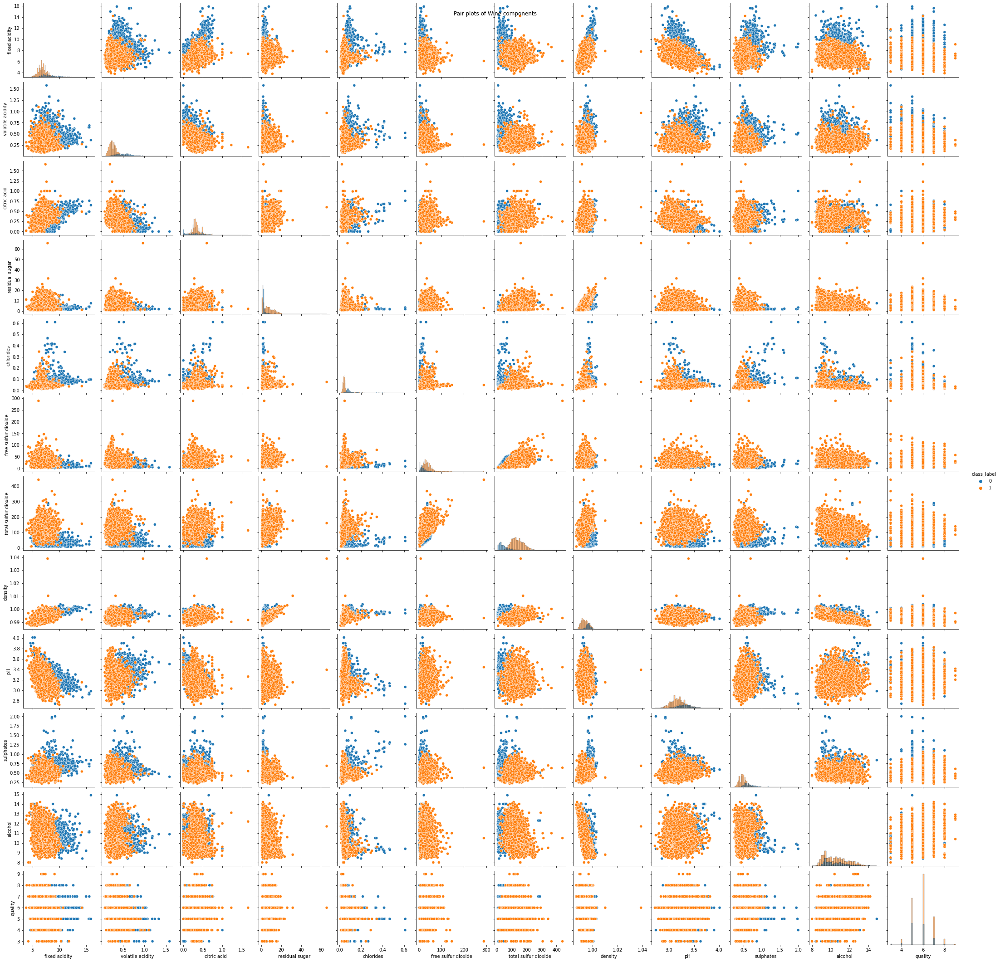

In [14]:
f = sns.pairplot(Wine_data, hue = "class_label", diag_kind="hist")
f.fig.suptitle("Pair plots of Wine components")

It is hard to read parir plots as the number of features are large, Hence going with univarient analysis

**TSNE** technique can be used for high dimentional data visualization; As dimentionality bemoces large it's harder to interpret pair plots

### TSNE

(6497, 12)


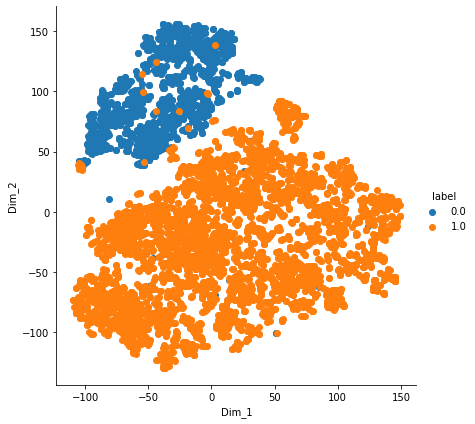

In [15]:
X = Wine_data.drop('class_label',axis='columns')
y = Wine_data['class_label']
X = StandardScaler().fit_transform(X)
print(X.shape)
model = TSNE(n_components=2,perplexity = 20, random_state=0, n_iter = 3000)
tsne_data = model.fit_transform(X)

tsne_data = np.vstack((tsne_data.T, y)).T
tsne_df = pd.DataFrame(data=tsne_data, columns=("Dim_1", "Dim_2", "label"))

sns.FacetGrid(tsne_df, hue="label", size=6).map(plt.scatter, 'Dim_1', 'Dim_2').add_legend()
plt.show()

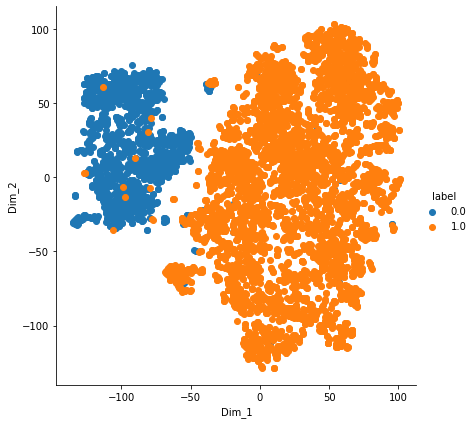

In [16]:
model = TSNE(n_components=2,perplexity = 30, random_state=0, n_iter = 3000)

tsne_data = model.fit_transform(X)

tsne_data = np.vstack((tsne_data.T, y)).T
tsne_df = pd.DataFrame(data=tsne_data, columns=("Dim_1", "Dim_2", "label"))

# Ploting the result of tsne
sns.FacetGrid(tsne_df, hue="label", size=6).map(plt.scatter, 'Dim_1', 'Dim_2').add_legend()
plt.show()

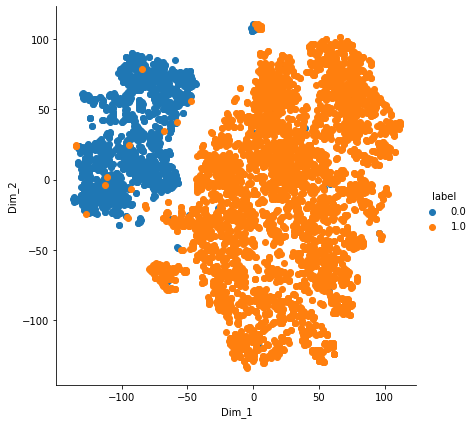

In [17]:
model = TSNE(n_components=2,perplexity = 25, random_state=0, n_iter = 3000)

tsne_data = model.fit_transform(X)

tsne_data = np.vstack((tsne_data.T, y)).T
tsne_df = pd.DataFrame(data=tsne_data, columns=("Dim_1", "Dim_2", "label"))

sns.FacetGrid(tsne_df, hue="label", size=6).map(plt.scatter, 'Dim_1', 'Dim_2').add_legend()
plt.show()

### Note: 0 is Red wine and 1 is white_wine

With the above TSNE plots data seperability is good for the perplexity values of 20, tried with different iterations are 3000  works for this data will

There are outliers in the data which can be visualized cleary with univarient analysis moving further; Features that causing the outliers can be detected

66 Joint plots are required to cover all the wine component combinations, Hence skipping Joint plots; As there are 12 features 

### Heatmap

Text(0.5, 1.0, 'Heatmap of Wine components')

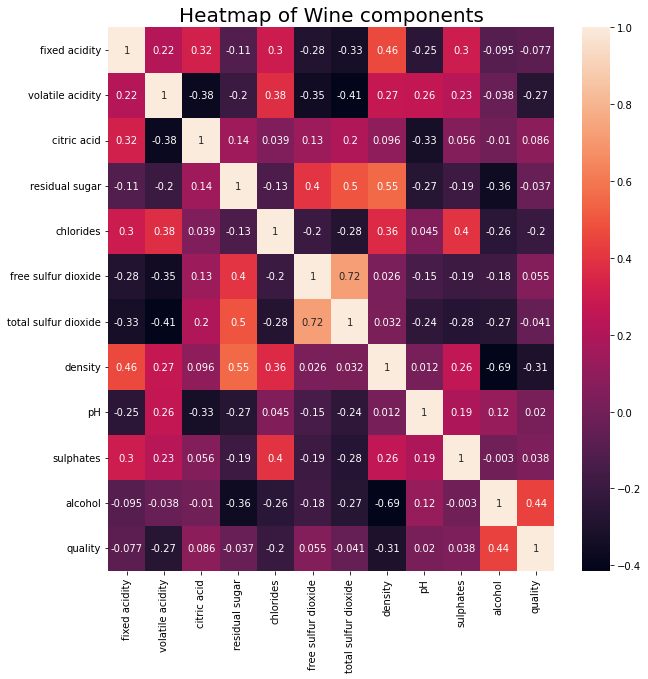

In [18]:
plt.figure(figsize=(10,10))
sns.heatmap(Wine_data.iloc[:, :-1].corr(), annot = True, robust = True)
plt.title('Heatmap of Wine components', fontsize = 20)

Heat maps gives corrilation betweent the features

With the above heat map, free sulfhur dioxide and total sulfhur dioxide are high positive correlated, density and alcohol are negatively correlated

Text(0.5, 0.98, 'Correlation of total sulfur dioxide and total sulfur dioxide')

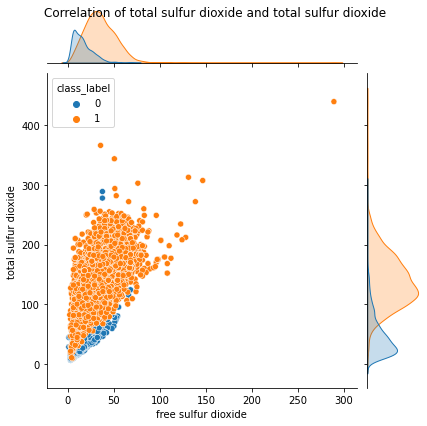

In [19]:
f = sns.jointplot(data = Wine_data, x = 'free sulfur dioxide', y = 'total sulfur dioxide', hue = 'class_label')
f.fig.suptitle("Correlation of total sulfur dioxide and total sulfur dioxide")

Text(0.5, 0.98, 'Correlation of alcohol and density')

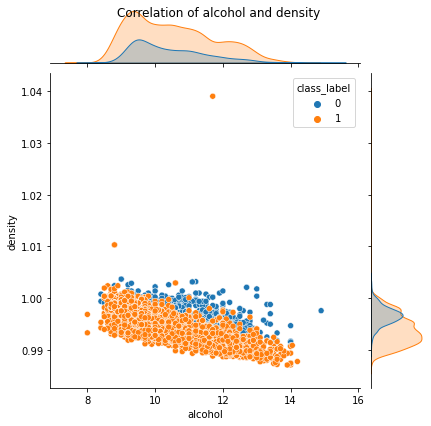

In [20]:
f = sns.jointplot(data = Wine_data, x = 'alcohol', y = 'density', hue = 'class_label')
f.fig.suptitle("Correlation of alcohol and density")

The value of correlation can be obtaied from the Heat map; One of the Features which has highest(1 is the highest) or lowest (-1 is the lowest)correlation can we dropped as there is high **linear dependency** can be observed with this features  

In [21]:
print(list(Wine_data.columns))

['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar', 'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol', 'quality', 'class_label']


# Univariant analysis

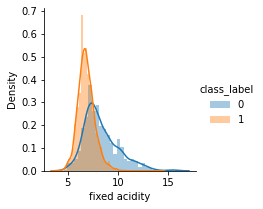

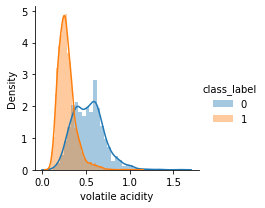

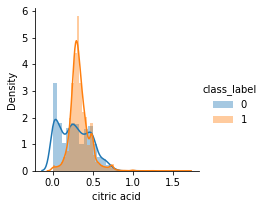

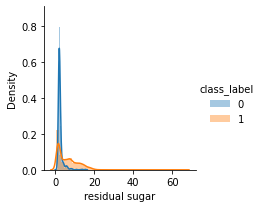

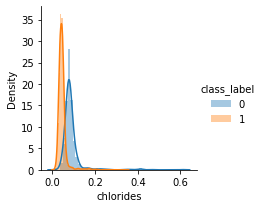

...

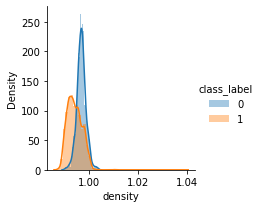

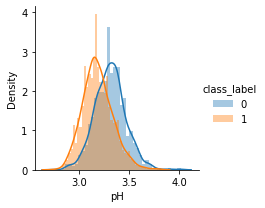

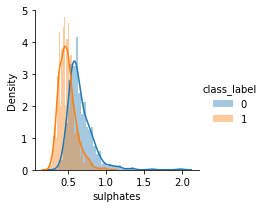

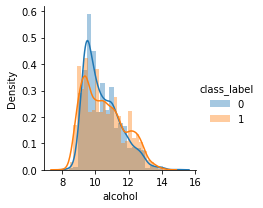

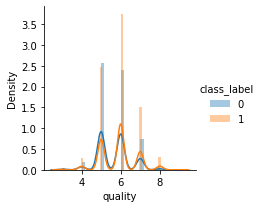

In [22]:
for x in list(Wine_data.columns)[:-1]:
    sns.FacetGrid(Wine_data, hue="class_label", size=3) \
   .map(sns.distplot, f"{x}") \
   .add_legend();
plt.show();

##### 	Distribution of alcohol for both the classes are almost similar, which indicates the alcohol content for red and white wine are same

#### voltaic acid, chlorides, total sulphur dioxide and density distributions are well separable, and these can be the most important features for classification of wine

####  	alcohol, pH, residual sugar and fixed acids have the skewness in the distribution

###  From the univariant analysis feature quality is almost overlapping which each other Hence dropping these features

In [23]:
Wine_data.drop(columns=["quality"], axis= "columns", inplace=True)

In [24]:
Wine_data.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,class_label
count,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000
mean,7.215307,0.339666,0.318633,5.443235,0.056034,30.525319,115.744574,0.994697,3.218501,0.531268,10.491801,0.753886
std,1.296434,0.164636,0.145318,4.757804,0.035034,17.749400,56.521855,0.002999,0.160787,0.148806,1.192712,0.430779
min,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000,0.000000
25%,6.400000,0.230000,0.250000,1.800000,0.038000,17.000000,77.000000,0.992340,3.110000,0.430000,9.500000,1.000000
50%,7.000000,0.290000,0.310000,3.000000,0.047000,29.000000,118.000000,0.994890,3.210000,0.510000,10.300000,1.000000
75%,7.700000,0.400000,0.390000,8.100000,0.065000,41.000000,156.000000,0.996990,3.320000,0.600000,11.300000,1.000000
max,15.900000,1.580000,1.660000,65.800000,0.611000,289.000000,440.000000,1.038980,4.010000,2.000000,14.900000,1.000000


In [25]:
fig = px.box(data_frame = Wine_data ,y = list(Wine_data.columns), color_discrete_sequence=["red", "blue"], color = "class_label",labels = {"variable" : "Wine components", "value": "value"},
       title = "Box plot for all the wine components")
fig.show()

In [26]:
fig = px.box(data_frame = Wine_data ,y = list(Wine_data.columns), color_discrete_sequence=["red", "blue"], color = "class_label",labels = {"variable" : "Wine components", "value": "Log_value"},
       title = "Box plot for all the wine components", log_y=True)
fig.show()

With the above plotly box plot components which contain sulfur in both the classes has high variance and more prone to outliers

White wine sulfur content is higher compared to red wine it may be due to imbalance in the data

# Imbalance data set

- Imbalance data set can lead to **high bias** model; perforance measures like **accuracy** is not the good metric to choose
- ML models like KNN may have an huge impacet of imbalance dataset

#  Balancing the data set, these following approaches can be used
- Undersampling
- Oversampling
- SMOTE (creating synthetic points)
- Ensemble with undersampling

- Not using the undersampling as we have fewer data points and under sampling leads to more wastage of the data
- Not using Over sampling, insted of recreasing the same samples SMOTE method can be used as it creates artificial points
- Ensemble model can be used if the is no restrictions on latency, usually ensemble models will take more time to train and test

#### Train Test_split

In [27]:
X = Wine_data.drop('class_label',axis='columns')
y = Wine_data['class_label']

In [28]:
smote = SMOTE(sampling_strategy='minority')
X_b, y_b = smote.fit_resample(X, y)
y_b.value_counts()

0    4898
1    4898
Name: class_label, dtype: int64

In [29]:
X_b['class_label'] = y_b

#### Balanced Wine Data

In [30]:
Wine_data_balance = X_b.copy()

In [31]:
Wine_data_balance.isna().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
class_label             0
dtype: int64

### TSNE with Balanced data

(9796, 11)


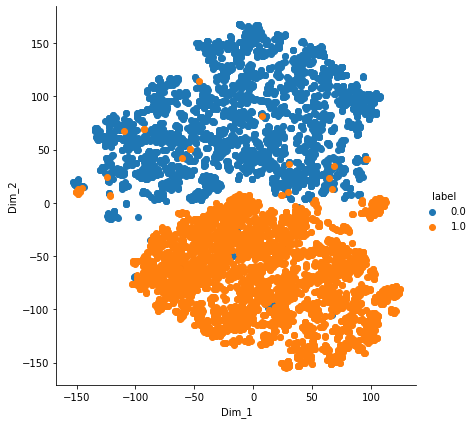

In [32]:
X = Wine_data_balance.drop('class_label',axis='columns')
y = Wine_data_balance['class_label']
X = StandardScaler().fit_transform(X)
print(X.shape)
model = TSNE(n_components=2,perplexity = 20, random_state=0, n_iter = 3000)
tsne_data = model.fit_transform(X)

tsne_data = np.vstack((tsne_data.T, y)).T
tsne_df = pd.DataFrame(data=tsne_data, columns=("Dim_1", "Dim_2", "label"))

# Ploting the result of tsne
sns.FacetGrid(tsne_df, hue="label", size=6).map(plt.scatter, 'Dim_1', 'Dim_2').add_legend()
plt.show()

##### Splitting the data in Train and test

In [33]:
X = Wine_data_balance.drop('class_label',axis='columns')
y = Wine_data_balance['class_label']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=15, stratify=y)
# From entire data x_train has 80% of share and X_test has 20%; Using 80% of the data for Train and 20% for test

In [34]:
models = []
models.append(("Logistic Regression:",LogisticRegression()))
models.append(("Naive Bayes:",GaussianNB()))
models.append(("K-Nearest Neighbour:",KNeighborsClassifier(n_neighbors=3)))
models.append(("Decision Tree:",DecisionTreeClassifier()))
models.append(("Support Vector Machine-linear:",SVC(kernel="linear")))
models.append(("Support Vector Machine-rbf:",SVC(kernel="rbf")))

In [35]:
results = []
names = []
for name,model in models:
    kfold = KFold(n_splits=10)
    cv_result = cross_val_score(model,X_train,y_train.values.ravel(), cv = kfold,scoring = "f1")
    names.append(name)
    results.append(cv_result)
for i in range(len(names)):
    print(names[i],results[i].mean()*100)

Logistic Regression: 97.98596861346142
Naive Bayes: 97.15072727449646
K-Nearest Neighbour: 95.296148798042
Decision Tree: 98.68875744062713
Support Vector Machine-linear: 98.69750657367149
Support Vector Machine-rbf: 90.6062003611791


# Logistic regression

Accuracy of logistic regression classifier on test data: 0.9948979591836735
              precision    recall  f1-score   support

           0       1.00      0.99      0.99       980
           1       0.99      1.00      0.99       980

    accuracy                           0.99      1960
   macro avg       0.99      0.99      0.99      1960
weighted avg       0.99      0.99      0.99      1960



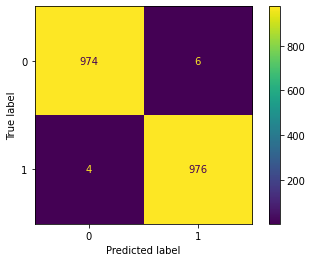

In [36]:
X = Wine_data_balance.drop('class_label',axis='columns')
y = Wine_data_balance['class_label']
X = StandardScaler().fit_transform(X)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=100, stratify=y)
logreg = LogisticRegression(penalty='l2')
logreg.fit(X_train, y_train)
y_pred = logreg.predict(X_test)
print('Accuracy of logistic regression classifier on test data:', logreg.score(X_test, y_test))
#confusion_matrix = confusion_matrix(y_test, y_pred)
plot_confusion_matrix(logreg, X_test, y_test)
print(classification_report(y_test, y_pred))

When data is standardized Precision, Recall, F1 scores are very high

# KNN

In [44]:
X = Wine_data_balance.drop('class_label',axis='columns')
y = Wine_data_balance['class_label']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=100, stratify=y)

Knn score: 0.9316326530612244
              precision    recall  f1-score   support

           0       0.91      0.96      0.93       980
           1       0.96      0.90      0.93       980

    accuracy                           0.93      1960
   macro avg       0.93      0.93      0.93      1960
weighted avg       0.93      0.93      0.93      1960



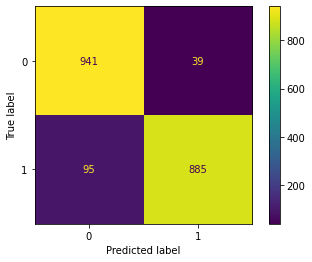

In [45]:
knn = KNeighborsClassifier(n_neighbors=10)
knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)
print("Knn score:", knn.score(X_test, y_test))
plot_confusion_matrix(knn, X_test, y_test)
print(classification_report(y_test, y_pred))

Knn score: 0.9428571428571428
              precision    recall  f1-score   support

           0       0.93      0.96      0.94       980
           1       0.96      0.92      0.94       980

    accuracy                           0.94      1960
   macro avg       0.94      0.94      0.94      1960
weighted avg       0.94      0.94      0.94      1960



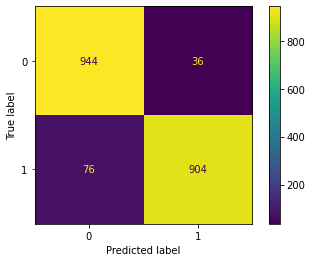

In [46]:
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)
print("Knn score:", knn.score(X_test, y_test))
plot_confusion_matrix(knn, X_test, y_test)
print(classification_report(y_test, y_pred))

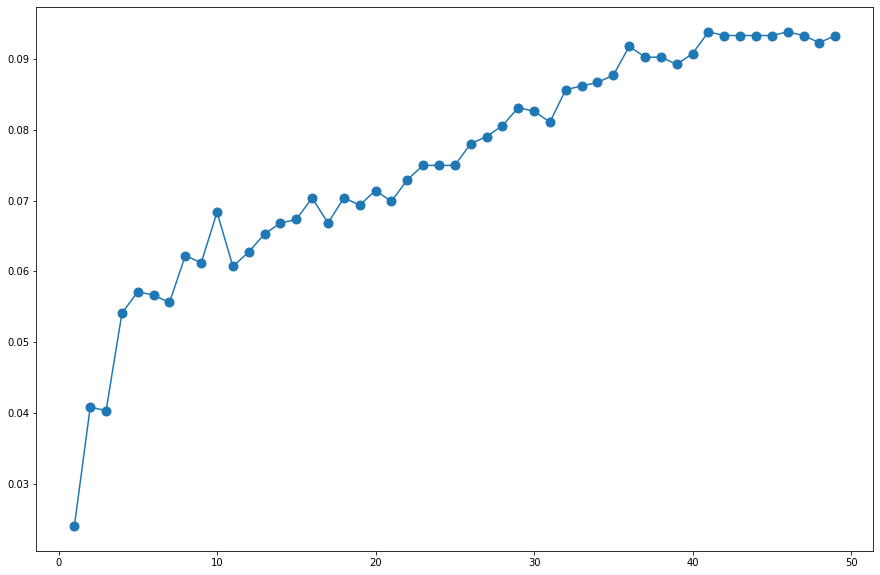

In [47]:
error_rate = []

for i in range(1,50):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train, y_train)
    pred = knn.predict(X_test)
    error_rate.append(np.mean(pred != y_test))

plt.figure(figsize=(15,10))
plt.plot(range(1,50),error_rate, marker='o', markersize=9)

Optimum K can be found using Grid search approach or by plotting the accuracy vs K graph

# Decision Tree

In [40]:
Wine_data_balance_tree = Wine_data_balance['class_label'].apply(lambda x: "Red" if (x == 0) else "White")
X = Wine_data_balance.drop('class_label',axis='columns')
y = Wine_data_balance_tree.values

clf = DecisionTreeClassifier(random_state=100)
model = clf.fit(X, y)
text_representation = tree.export_text(clf)
print(text_representation)

|--- feature_4 <= 0.06
|   |--- feature_6 <= 54.00
|   |   |--- feature_4 <= 0.04
|   |   |   |--- feature_7 <= 0.99
|   |   |   |   |--- feature_8 <= 3.71
|   |   |   |   |   |--- class: White
|   |   |   |   |--- feature_8 >  3.71
|   |   |   |   |   |--- class: Red
|   |   |   |--- feature_7 >  0.99
|   |   |   |   |--- class: Red
|   |   |--- feature_4 >  0.04
|   |   |   |--- feature_9 <= 0.41
|   |   |   |   |--- feature_2 <= 0.12
|   |   |   |   |   |--- class: Red
|   |   |   |   |--- feature_2 >  0.12
|   |   |   |   |   |--- class: White
|   |   |   |--- feature_9 >  0.41
|   |   |   |   |--- feature_7 <= 0.99
|   |   |   |   |   |--- class: White
|   |   |   |   |--- feature_7 >  0.99
|   |   |   |   |   |--- feature_7 <= 0.99
|   |   |   |   |   |   |--- feature_8 <= 3.36
|   |   |   |   |   |   |   |--- class: White
|   |   |   |   |   |   |--- feature_8 >  3.36
|   |   |   |   |   |   |   |--- class: Red
|   |   |   |   |   |--- feature_7 >  0.99
|   |   |   |   |   |   |

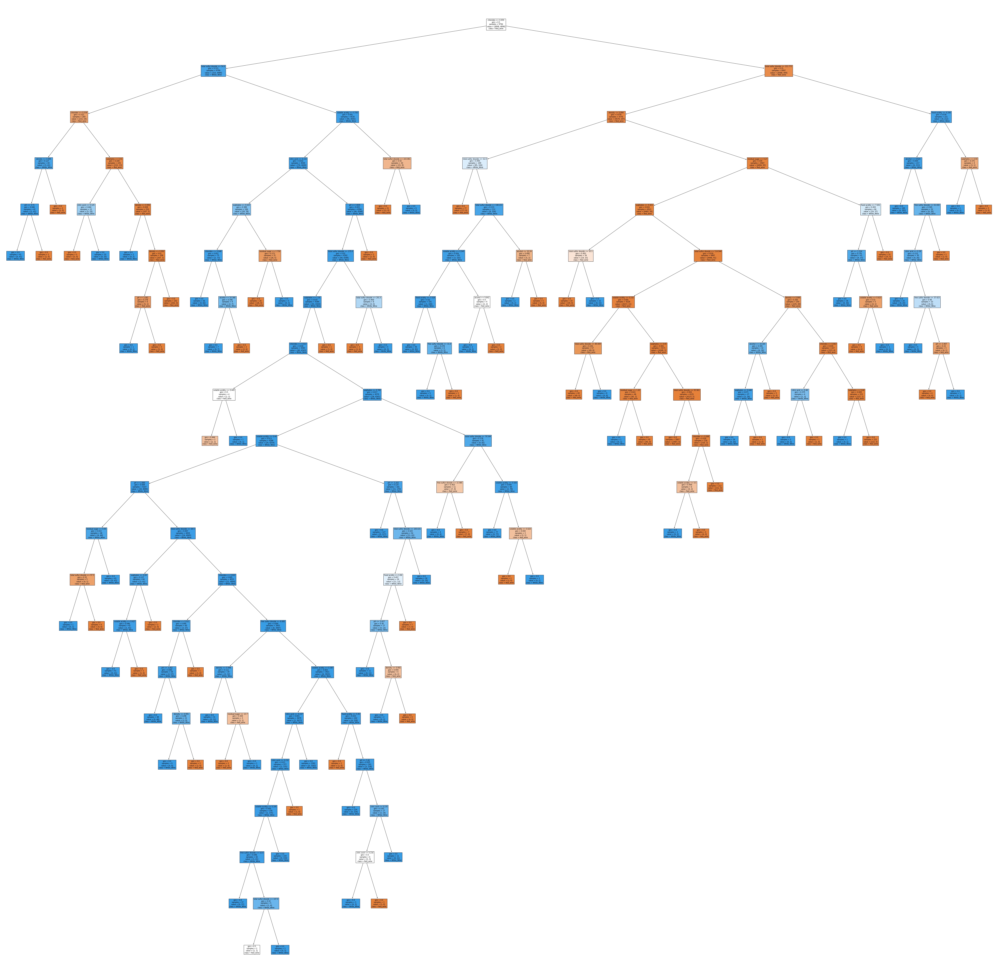

In [41]:
fig = plt.figure(figsize=(100,100))
f = tree.plot_tree(clf, 
                   feature_names=X.columns,
                   class_names= ["Red_wine", "White_Wine"],
                   filled=True)

In [42]:
fig.savefig("wineClassification.pdf")

In [43]:
fig.savefig("WineClassification.png")